**import packages for analysis**

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
from matplotlib import rcParams
import seaborn as sb
import matplotlib.pyplot as plt
import anndata as ad
from scipy import sparse
from anndata import AnnData
import time
import MACA as maca
import seaborn as sns
from scipy import stats
from scipy.stats import ranksums
import bbknn as bbknn
import scipy.sparse as sp

**general setting**

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.20.3 scipy==1.10.0 pandas==1.5.2 scikit-learn==1.1.3 statsmodels==0.13.5 python-igraph==0.10.2 louvain==0.8.0 pynndescent==0.5.6


In [3]:
# the file that will store the analysis results
#results_file = '/home/mmokhtari/INF_analysis/INF_analysis.h5ad' 

**reading the raw_feature_bc_matrix**

In [4]:
adata = sc.read_10x_h5('/home/mmokhtari/INF_analysis/raw_feature_bc_matrix.h5')

reading /home/mmokhtari/INF_analysis/raw_feature_bc_matrix.h5
 (0:00:02)


**retriving the previously identified pDC cell IDs and merging with the rest of the dataset**

In [5]:
adata_DONE_WITH_pDCs = sc.read_h5ad('/home/mmokhtari/INF_analysis/INF_analysis_with_pDC.h5ad')

In [6]:
dup=adata_DONE_WITH_pDCs[adata_DONE_WITH_pDCs.obs.index.duplicated()].obs.index.tolist()

In [7]:
adata_DONE_WITH_pDCs_dups = adata_DONE_WITH_pDCs[adata_DONE_WITH_pDCs.obs.index.isin(dup)]
adata_DONE_WITH_pDCs_dups = adata_DONE_WITH_pDCs_dups[adata_DONE_WITH_pDCs_dups.obs.Final_Annotation=="pDC"]

In [8]:
adata_DONE_WITH_pDCs = adata_DONE_WITH_pDCs[~adata_DONE_WITH_pDCs.obs.index.isin(dup)]


In [9]:
new_list=[adata_DONE_WITH_pDCs_dups,adata_DONE_WITH_pDCs]
adata_DONE_WITH_pDCs = ad.concat(new_list)

In [10]:
list_CELLS_TO_KEEP=adata_DONE_WITH_pDCs.obs.index.tolist()

In [11]:
adata_final_filtered=adata[adata.obs.index.isin(list_CELLS_TO_KEEP)]

In [12]:
#adata_final_filtered.obs["Final_Annotation"]=adata_DONE_WITH_pDCs.obs["Final_Annotation"]
#adata_final_filtered.obs["cell_type_donor"]==adata_DONE_WITH_pDCs.obs.cell_type_donor

In [13]:
keep_annot=dict(zip(adata_DONE_WITH_pDCs.obs.index.tolist(),adata_DONE_WITH_pDCs.obs.Final_Annotation.tolist()))
keep_donor=dict(zip(adata_DONE_WITH_pDCs.obs.index.tolist(),adata_DONE_WITH_pDCs.obs.donor.tolist()))
keep_cell_type_donor=dict(zip(adata_DONE_WITH_pDCs.obs.index.tolist(),adata_DONE_WITH_pDCs.obs.cell_type_donor.tolist()))

In [14]:
adata_final_filtered.obs["Final_Annotation"] = adata_final_filtered.obs.index.map(keep_annot).astype("category")
adata_final_filtered.obs["donor"] = adata_final_filtered.obs.index.map(keep_donor).astype("category")
adata_final_filtered.obs["cell_type_donor"] = adata_final_filtered.obs.index.map(keep_cell_type_donor).astype("category")

In [15]:
adata_final_filtered.obs.cell_type_donor=adata_final_filtered.obs.cell_type_donor.str.replace("-","_")

In [16]:
adata_final_filtered = adata_final_filtered.copy()

In [17]:
adata_final_filtered.var_names_make_unique()

**genes with highest fraction of counts**

normalizing counts per cell
    finished (0:00:00)


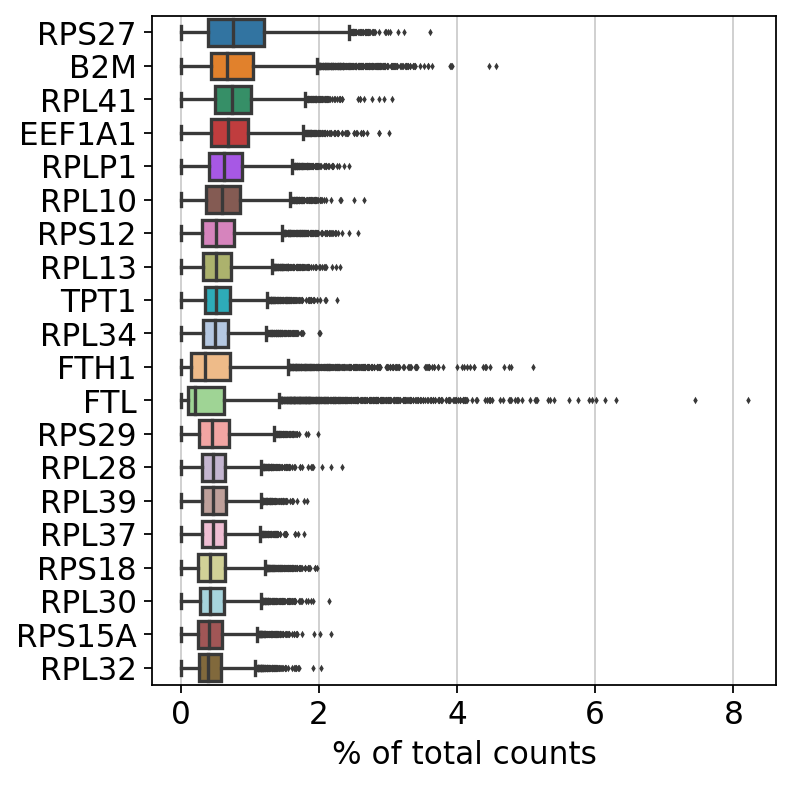

In [18]:
sc.pl.highest_expr_genes(adata_final_filtered, n_top=20, )

**filtering the cells with low unique gene number and genes expressed in few cells**


In [19]:
sc.pp.filter_cells(adata_final_filtered, min_genes=200)
sc.pp.filter_genes(adata_final_filtered, min_cells=2)

filtered out 3759 genes that are detected in less than 2 cells


**annotate the group of mitochondrial genes as 'mt'**


In [20]:
adata_final_filtered.var['mt'] = adata_final_filtered.var_names.str.startswith('MT-')  
sc.pp.calculate_qc_metrics(adata_final_filtered, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

**filtering for mts and n_genes_by_counts**

In [21]:
adata_final_filtered = adata_final_filtered[adata_final_filtered.obs.n_genes_by_counts < 4000, :]
adata_final_filtered = adata_final_filtered[adata_final_filtered.obs.pct_counts_mt < 5, :]

**A violin plot of some of the computed quality measures**


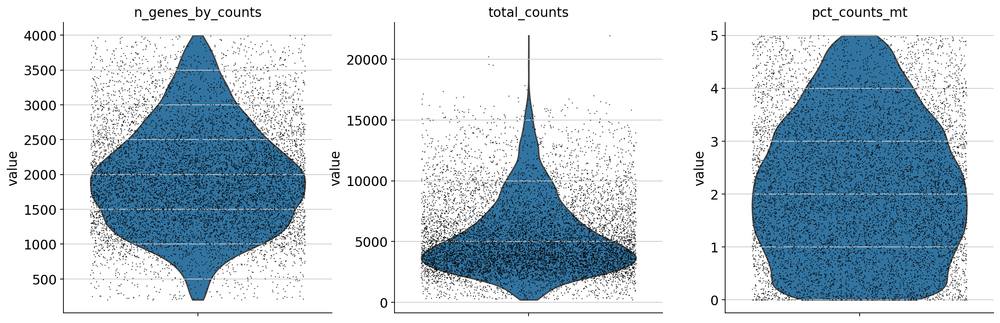

In [22]:
adata_final_filtered.var_names_make_unique()
sc.pl.violin(adata_final_filtered, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

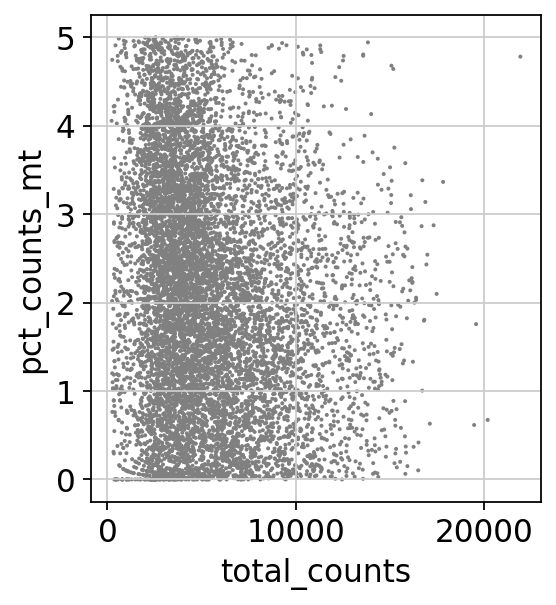

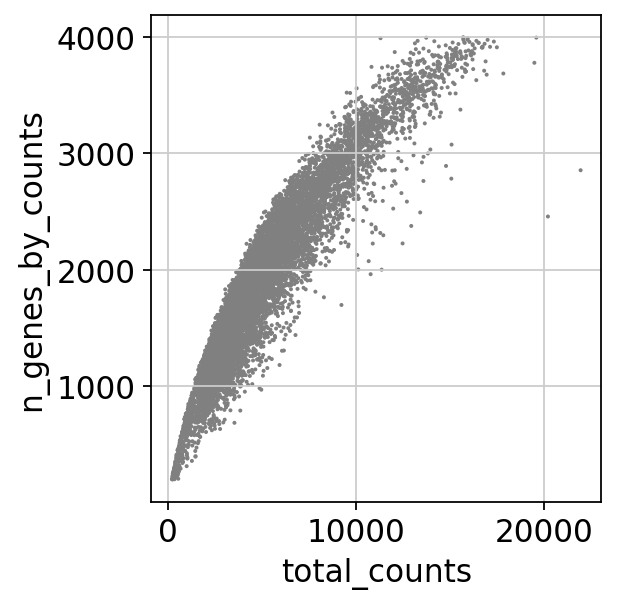

In [23]:
sc.pl.scatter(adata_final_filtered, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata_final_filtered, x='total_counts', y='n_genes_by_counts')

In [24]:
adata_final_filtered = adata_final_filtered.copy()

**count normalizing the data**

In [25]:
sc.pp.normalize_total(adata_final_filtered, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


**logaritmazing the data**

In [26]:
sc.pp.log1p(adata_final_filtered)

**Identify highly-variable genes**

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


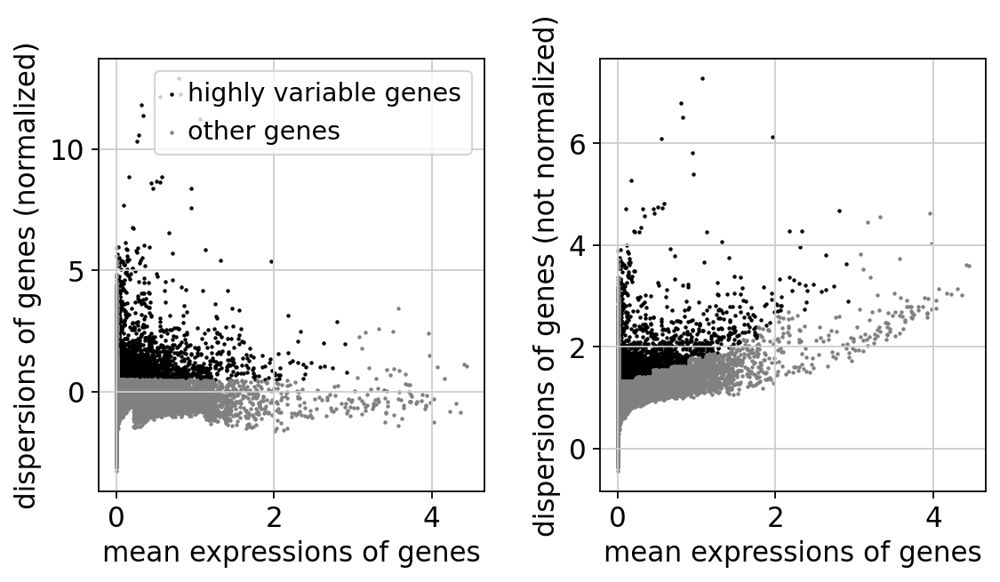

In [27]:
sc.pp.highly_variable_genes(adata_final_filtered, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata_final_filtered)

**highest expressed genes**

normalizing counts per cell
    finished (0:00:00)


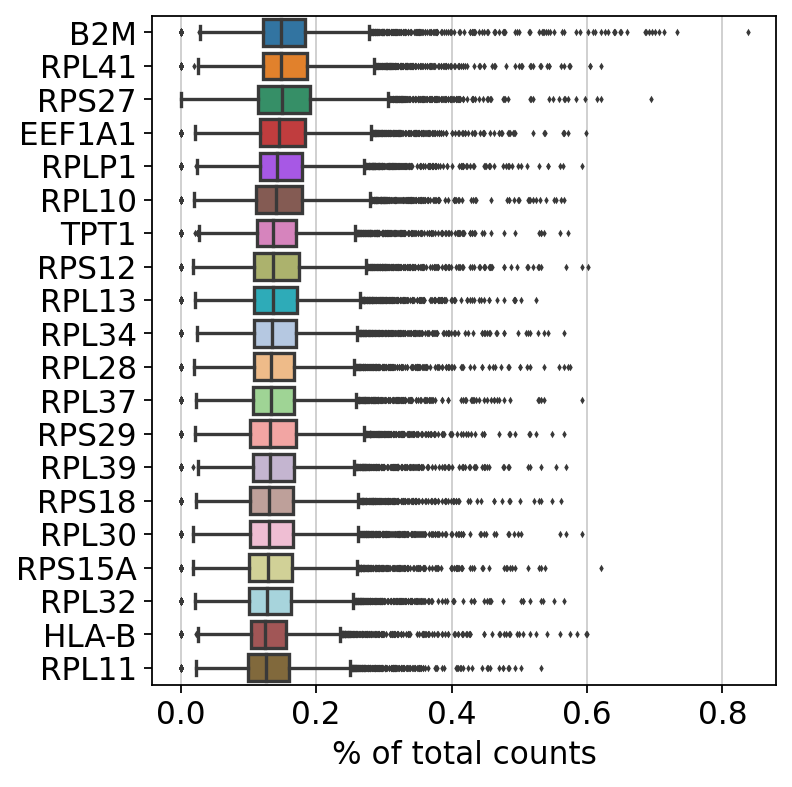

In [28]:
sc.pl.highest_expr_genes(adata_final_filtered, n_top=20, )

In [29]:
adata_final_filtered.raw = adata_final_filtered


In [30]:
adata_final_filtered = adata_final_filtered[:, adata_final_filtered.var.highly_variable]


In [31]:
adata_final_filtered = adata_final_filtered.copy()

In [32]:
#Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
#sc.pp.regress_out(adata_final_filtered, ['total_counts', 'pct_counts_mt'])


**Scale each gene to unit variance**


In [33]:
sc.pp.scale(adata_final_filtered, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


**running PCA**

In [34]:
sc.tl.pca(adata_final_filtered, svd_solver='arpack')


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


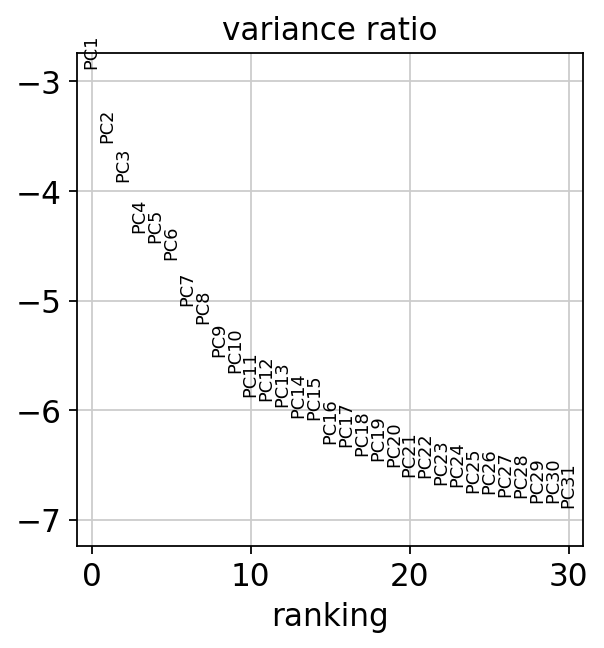

In [35]:
sc.pl.pca_variance_ratio(adata_final_filtered, log=True)


In [36]:
#adata_final_filtered.write(results_file)


**Computing the neighborhood graph**

In [37]:
sc.pp.neighbors(adata_final_filtered, n_neighbors=10, n_pcs=40)


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:06:27)


**Visualize with umaps**

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)


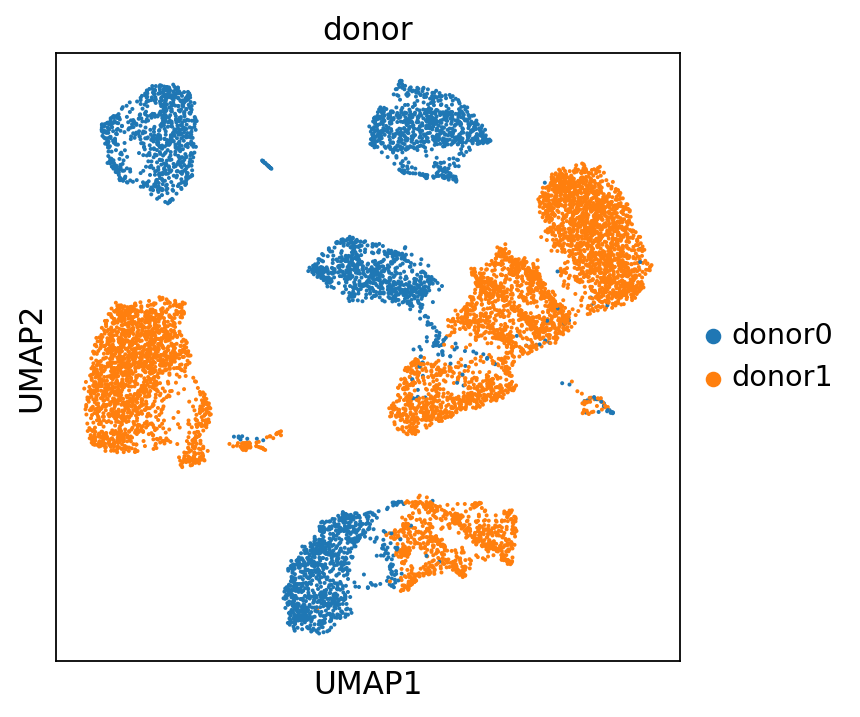

In [38]:
rcParams['figure.figsize']=(5,5)
sc.tl.umap(adata_final_filtered)
sc.pl.umap(adata_final_filtered, color='donor')


**Perform leiden clustering - using highly variable genes**

In [39]:
sc.tl.leiden(adata_final_filtered)

running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


**Perform louvain clustering - using highly variable genes**

In [40]:
sc.tl.louvain(adata_final_filtered, key_added='louvain_r1.2',resolution=1.2)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 21 clusters and added
    'louvain_r1.2', the cluster labels (adata.obs, categorical) (0:00:00)


**Visualize the clusters with umap**

<Figure size 400x400 with 0 Axes>

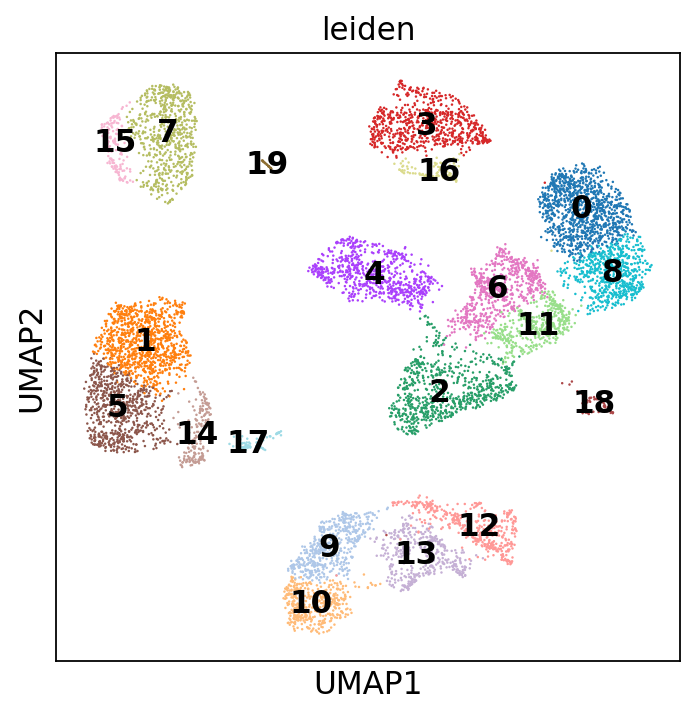

In [41]:
rcParams['figure.figsize']=(5,5)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata_final_filtered, color=['leiden'],  legend_loc='on data',edgecolor='none', size=5, show=True, linewidths=10)

**differential expression analysis using Wilcoxon rank-sum test**

In [42]:
sc.tl.rank_genes_groups(adata_final_filtered, 'leiden', method='wilcoxon')
#sc.pl.rank_genes_groups(adata_final_filtered, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:17)


**Visualize the clusters with umap**

<Figure size 800x800 with 0 Axes>

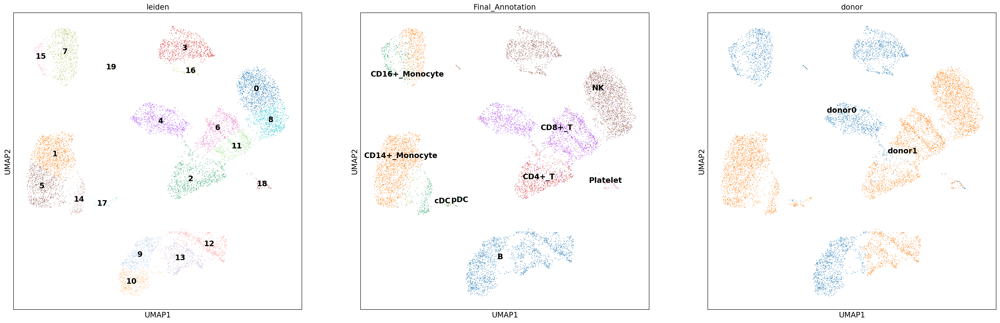

In [43]:
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata_final_filtered, color=['leiden',"Final_Annotation","donor"],  legend_loc='on data',edgecolor='none', size=5, show=True, linewidths=10)

**adjusting the leiden clustering resolution**

In [44]:
sc.tl.leiden(adata_final_filtered,key_added="leiden_2",resolution=0.13)

running Leiden clustering
    finished: found 12 clusters and added
    'leiden_2', the cluster labels (adata.obs, categorical) (0:00:00)


In [45]:
sc.set_figure_params(vector_friendly=True,dpi=648.0)
plt.rcParams['figure.dpi'] = 500.0

**Visualize the clusters with umap** 


In [46]:
#rcParams['figure.figsize']=(10,10)
#fig_ind=np.arange(131, 133)
#fig = plt.figure()
#fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata_final_filtered, color=['leiden_2',"donor","Final_Annotation"],edgecolor='none', size=20, show=True, linewidths=10,title=["Donor","Leiden Clustering","Annotation"],save=True,wspace=0.3)

**creating the markers dictionary**

In [47]:
marker_genes_dict_final = {
    'CD4+_T':['CAMK4','IL7R','BCL11B', 'LTB','FOXP3'],
    'CD8+_T':['IL7R','NELL2','CD8A','CCL5','CD3E','RFX7','AKAP9','FYN',
              'IKZF2'],
    'NK':['GNLY', 'MCTP2','XCL2', 'CD247','GZMB','NCR3','KLRB1','ARAP2','KLRC1'],
    'B':['IGHM','CD79A','CD74','EZR','CD79A','TNFRSF13C'],
    'cDC':['CST3','HLA-DRA','HLA-DPA1'],
    'CD14+_Monocyte': ['LYZ','S100A9', 'S100A8','CD14'],#
    'CD16+_Monocyte': ['LST1', 'AIF1','IFITM3','FCGR3A'],#
    'Platelet': ['PPBP','NRGN','GNG11'],#
    'pDC':["IL3RA","HLA-DRA","CLEC4C","NRP1","PTPRC","ITM2C", "PLD4", "SERPINF1", "LILRA4", "IL3RA", "TPM2",
                                       "MZB1", "SPIB", "IRF4", "SMPD3","IL12A","ZEB2","TCF4","IRF4","IRF8"]
}
marker_genes_dict_final_paper = {
    'CD4+_T':['CD4','IL7R','FOXP3'],
    'CD8+_T':['CD8A','CCL5','CD3E'],
    'NK':['GNLY','XCL2','NCR3'],
    'B':['CD19','IGHM','CD79A'],
    'cDC':['CST3','FCER1A','CLEC10A'],
    'CD14+_Monocyte': ['S100A9', 'S100A8','CD14'],#
    'CD16+_Monocyte': ['LST1','IFITM3','FCGR3A'],#
    #
    'pDC':["CLEC4C","NRP1","IL3RA"],
    'Platelet': ['PPBP','NRGN','GNG11']
}
#IL7R

**matrix plot of the markers**

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Final_Annotation']`


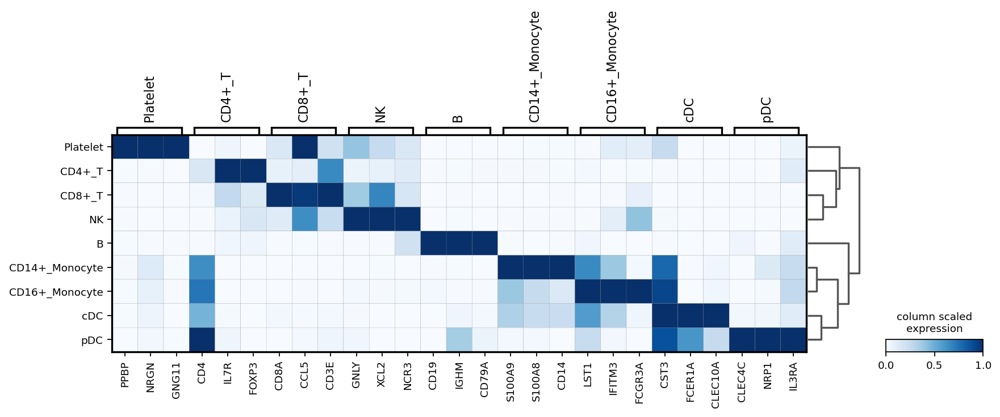

In [48]:
sc.set_figure_params(scanpy=True, fontsize=10,figsize=(8,6))

sc.pl.matrixplot(adata_final_filtered, marker_genes_dict_final_paper ,'Final_Annotation', dendrogram=True, 
                 cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression', use_raw=True,var_group_labels=[np.unique(adata_final_filtered.obs["Final_Annotation"])],save=True,
        # categories_order=['B', 'CD4+_T', 'CD8+_T','NK', 'CD16+_Monocyte','CD14+_Monocyte','cDC','pDC','Platelet']
                )

**UMAP visualization of the markers**

In [49]:
#adata_pDC.obs
#donor
#Visualize the clusters with umap 
#rcParams['figure.figsize']=(10,10)
#fig_ind=np.arange(131, 133)
#fig = plt.figure()
#fig.subplots_adjust(hspace=0.4, wspace=0.6)

#sc.pl.umap(adata_final_filtered, color=["donor","Final_Annotation","n_genes_by_counts","leiden",'CAMK4','IL7R','BCL11B', 'LTB','FOXP3','IL7R','NELL2','CD8A','CCL5','CD3E','RFX7','AKAP9','FYN',
#              'IKZF2','GNLY', 'MCTP2','XCL2', 'CD247','GZMB','NCR3','KLRB1','ARAP2','KLRC1',
#                'IGHM','CD79A','CD74','EZR','CD79A','TNFRSF13C','CST3','HLA-DRA','HLA-DPA1','LYZ','S100A9', 'S100A8','CD14',
#                'LST1', 'AIF1','IFITM3','FCGR3A','PPBP','NRGN','GNG11',"TPM2","ASIP","GPM6B","SHD","NTM","SCT",
#                "KCNA5","SCARA5","EPHA2","IL3RA","HLA-DRA","CLEC4C","NRP1","PTPRC","ITM2C", "PLD4", "SERPINF1", "LILRA4", "IL3RA", "TPM2",
#                                       "MZB1", "SPIB", "IRF4", "SMPD3","IL12A","ZEB2","TCF4","IRF4","IRF8"],edgecolor='none', size=60, show=True, linewidths=10,legend_fontsize = "x-small",use_raw=True)

In [50]:

#sc.pl.stacked_violin(adata_final_filtered, marker_genes, groupby='Final_Annotation',use_raw=True, show=False,save=True)


**dot plot of cytotoxicity signatures of all cell types**

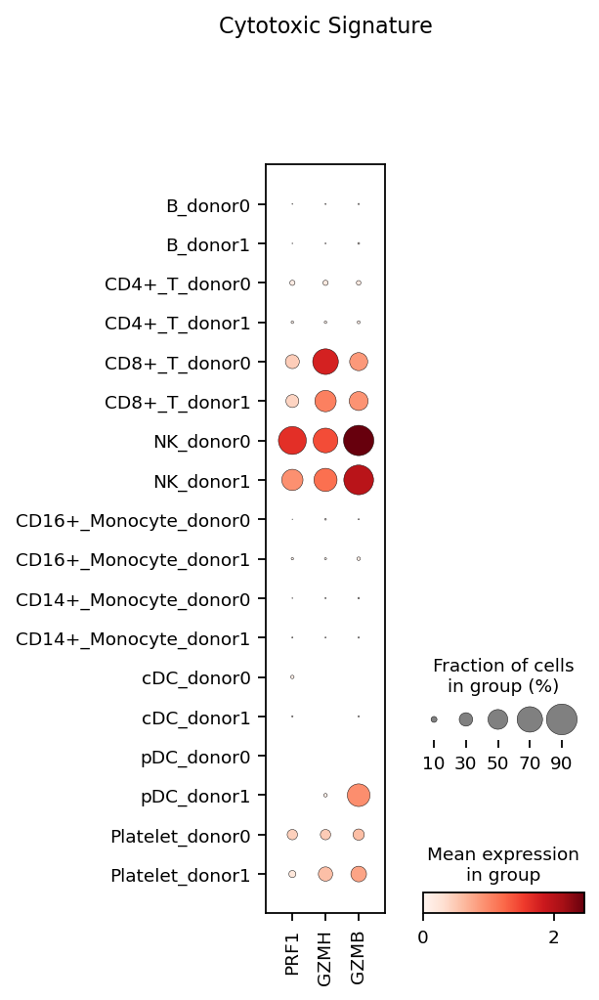

In [51]:
cytotoxic_signature = ["PRF1", "GZMH", "GZMB"]
sc.pl.dotplot(adata_final_filtered,cytotoxic_signature, groupby='cell_type_donor',dendrogram=False, use_raw=True,title="Cytotoxic Signature",
             categories_order=[
                                                                                   "B_donor0","B_donor1",
                                                                                   "CD4+_T_donor0","CD4+_T_donor1",
                                                                                   "CD8+_T_donor0","CD8+_T_donor1",
                                                                                   "NK_donor0","NK_donor1",
                                                                                   "CD16+_Monocyte_donor0","CD16+_Monocyte_donor1",
                                                                                   "CD14+_Monocyte_donor0","CD14+_Monocyte_donor1",
                                                                                   "cDC_donor0","cDC_donor1",
                                                                                   "pDC_donor0","pDC_donor1",
                              "Platelet_donor0","Platelet_donor1"],save=True)

**dot plot of exhaustion signatures of all cell types**

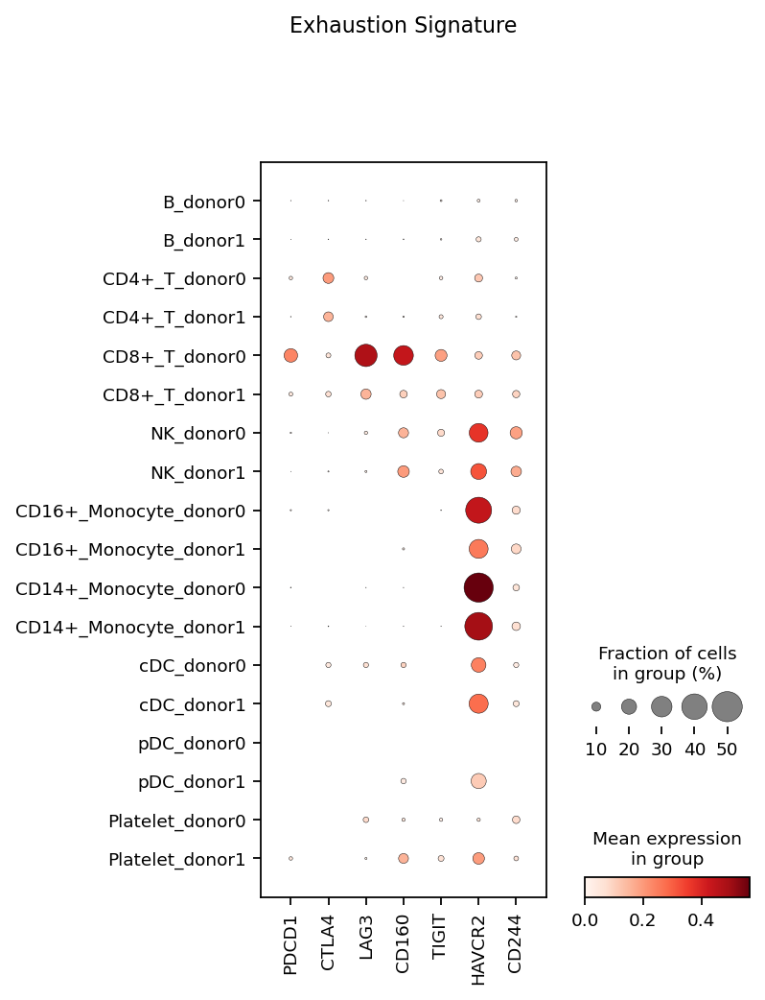

In [52]:
exhaustion_signature = ["PDCD1", "CTLA4", "LAG3", "CD160", "TIGIT", "HAVCR2", "CD244"]
sc.pl.dotplot(adata_final_filtered,exhaustion_signature, groupby='cell_type_donor',dendrogram=False, use_raw=True,title="Exhaustion Signature",
             categories_order=[
                                                                                   "B_donor0","B_donor1",
                                                                                   "CD4+_T_donor0","CD4+_T_donor1",
                                                                                   "CD8+_T_donor0","CD8+_T_donor1",
                                                                                   "NK_donor0","NK_donor1",
                                                                                   "CD16+_Monocyte_donor0","CD16+_Monocyte_donor1",
                                                                                   "CD14+_Monocyte_donor0","CD14+_Monocyte_donor1",
                                                                                   "cDC_donor0","cDC_donor1",
                                                                                   "pDC_donor0","pDC_donor1",
                              "Platelet_donor0","Platelet_donor1"],save=True)

**slicing the data for CD8 cells**

In [53]:
adata_final_filtered_CD8s = adata_final_filtered[(adata_final_filtered.obs.Final_Annotation=='CD8+_T')]

**creating the type 1 ISG signature dictionary**

In [54]:
type_1_ISG_signature = ["ISG15", "IFI6", "IFI44L", "IFI44", "RSAD2", "CXCL10", "IFIT2", "IFIT3", "IFIT1", "IFITM3", 
                        "OAS1", "OAS3", "OAS2", "OASL", "EPSTI1", 
                        "RNASE1", "RNASE2", "IFI27", "XAF1", "LGALS3BP", "SIGLEC1", "USP18", "APOBEC3A", "APOBEC3B", "MX1"]

**calculating the cytotoxicity, exhustion and type 1 ISG signature scores for CD8 cells**

In [55]:
sc.tl.score_genes(adata_final_filtered_CD8s,exhaustion_signature,score_name='score_exhaustion_signature')
sc.tl.score_genes(adata_final_filtered_CD8s,cytotoxic_signature,score_name='score_cytotoxic_signature')
sc.tl.score_genes(adata_final_filtered_CD8s,type_1_ISG_signature,score_name='score_type_1_ISG_signature')

computing score 'score_exhaustion_signature'
    finished: added
    'score_exhaustion_signature', score of gene set (adata.obs).
    250 total control genes are used. (0:00:00)
computing score 'score_cytotoxic_signature'
    finished: added
    'score_cytotoxic_signature', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)
computing score 'score_type_1_ISG_signature'
    finished: added
    'score_type_1_ISG_signature', score of gene set (adata.obs).
    696 total control genes are used. (0:00:00)


**violin plots of cytotoxicity, exhustion and type 1 ISG signature scores in CD8 cells**

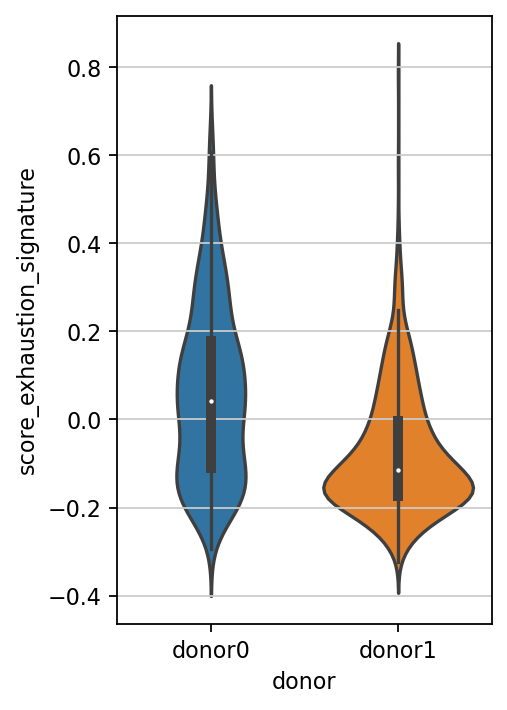

In [56]:
plt.figure(figsize=(3,5))
sns.violinplot(x=adata_final_filtered_CD8s.obs["donor"],y=adata_final_filtered_CD8s.obs["score_exhaustion_signature"],save=True,inner="box")
plt.savefig('score_exhaustion_signature.pdf')

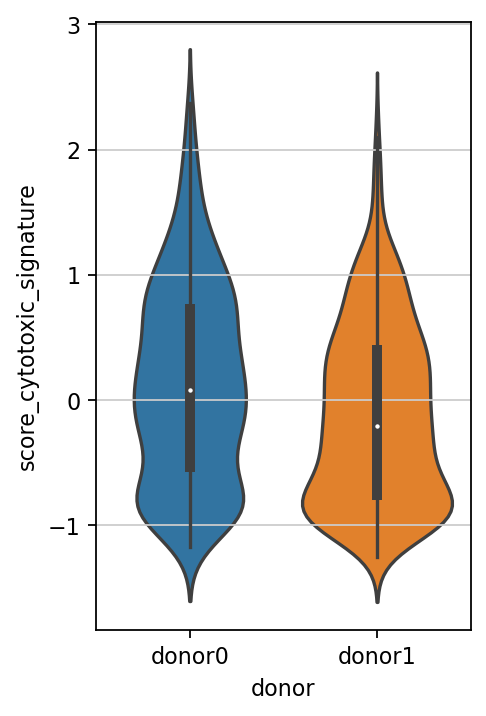

In [57]:
plt.figure(figsize=(3,5))

sns.violinplot(x=adata_final_filtered_CD8s.obs["donor"],y=adata_final_filtered_CD8s.obs["score_cytotoxic_signature"],save=True,inner="box")
plt.savefig('score_cytotoxic_signature.pdf')

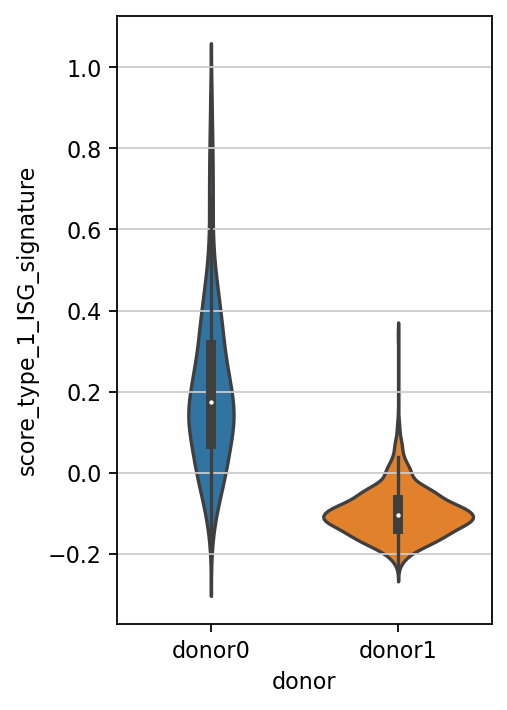

In [58]:
plt.figure(figsize=(3,5))
sns.violinplot(x=adata_final_filtered_CD8s.obs["donor"],y=adata_final_filtered_CD8s.obs["score_type_1_ISG_signature"],inner="box")
plt.savefig('score_type_1_ISG_signature.pdf')

**dot plots of exhustion and type 1 ISG signature scores in CD8 cells**

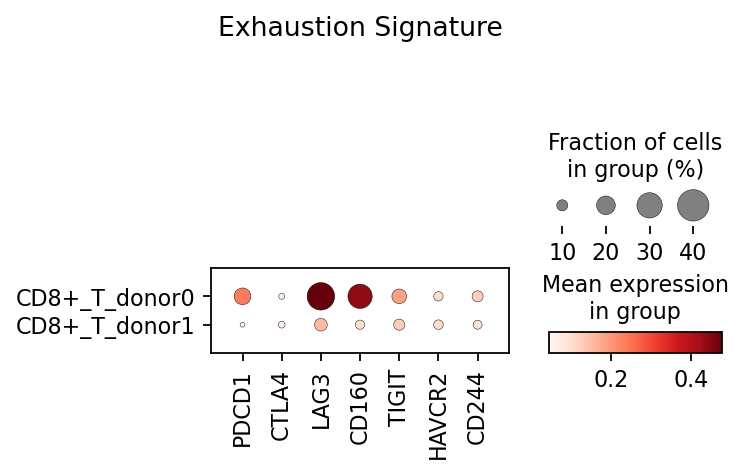

In [59]:
sc.set_figure_params(scanpy=True, fontsize=12,figsize=(8,6))

sc.pl.dotplot(adata_final_filtered_CD8s,exhaustion_signature, groupby='cell_type_donor',dendrogram=False,use_raw=True,title="Exhaustion Signature",
             categories_order=[
                                                                                   "CD8+_T_donor0","CD8+_T_donor1",
                                                                                   ],save=True)

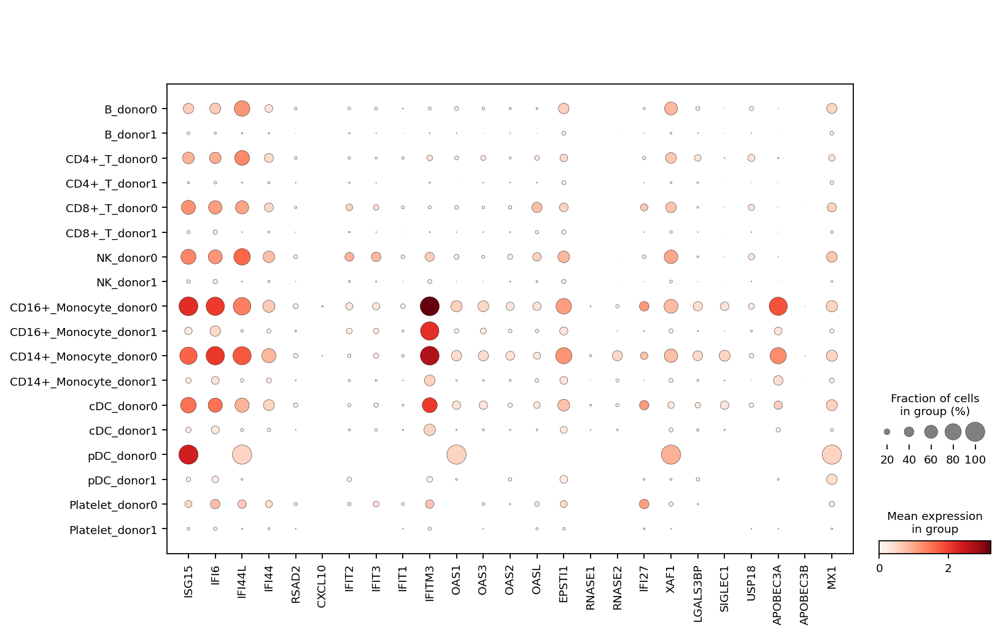

In [60]:
sc.set_figure_params(scanpy=True, fontsize=10,figsize=(6,6))

sc.pl.dotplot(adata_final_filtered,type_1_ISG_signature, groupby='cell_type_donor',dendrogram=False, use_raw=True,
             categories_order=[
                                                                                   "B_donor0","B_donor1",
                                                                                   "CD4+_T_donor0","CD4+_T_donor1",
                                                                                   "CD8+_T_donor0","CD8+_T_donor1",
                                                                                   "NK_donor0","NK_donor1",
                                                                                   "CD16+_Monocyte_donor0","CD16+_Monocyte_donor1",
                                                                                   "CD14+_Monocyte_donor0","CD14+_Monocyte_donor1",
                                                                                   "cDC_donor0","cDC_donor1",
                                                                                   "pDC_donor0","pDC_donor1",
                              "Platelet_donor0","Platelet_donor1"],save=True)

**violin plot of TLR genes' expression across cell types**

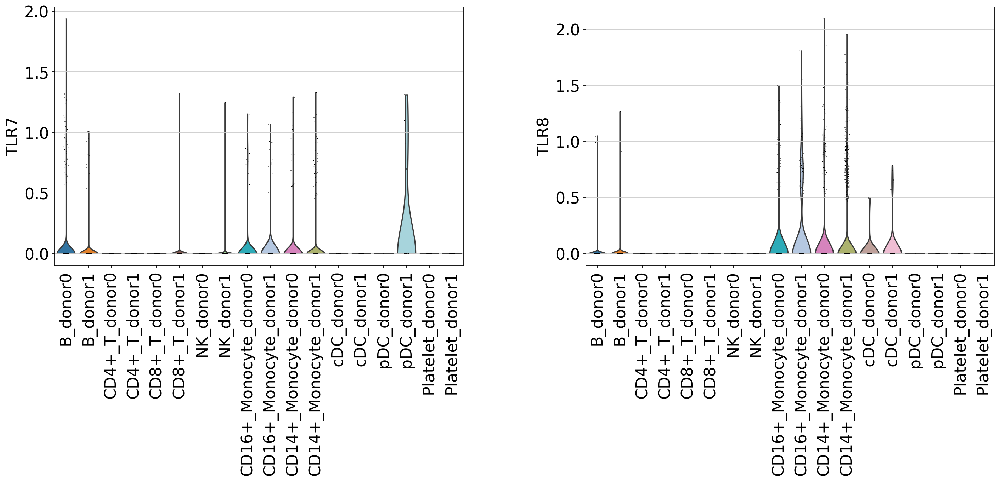

In [61]:
sc.set_figure_params(scanpy=True, fontsize=20,figsize=(8,6))
sc.pl.violin(adata_final_filtered, ['TLR7', 'TLR8'], groupby='cell_type_donor',rotation=90,use_raw=True,order=[
                                                                                   "B_donor0","B_donor1",
                                                                                   "CD4+_T_donor0","CD4+_T_donor1",
                                                                                   "CD8+_T_donor0","CD8+_T_donor1",
                                                                                   "NK_donor0","NK_donor1",
                                                                                   "CD16+_Monocyte_donor0","CD16+_Monocyte_donor1",
                                                                                   "CD14+_Monocyte_donor0","CD14+_Monocyte_donor1",
                                                                                   "cDC_donor0","cDC_donor1",
                                                                                   "pDC_donor0","pDC_donor1",
                                                                                   "Platelet_donor0","Platelet_donor1"],
            stripplot=True,save=True,grid=False)

#sc.pl.violin(adata_final_filtered, ['TLR7', 'TLR8'], groupby='donor',rotation=90)

**cell type composition plots**

In [62]:
df = pd.DataFrame([['donor 0', 963/3353, 71/3353, 678/3353, 824/3353,266/3353,492/3353,21/3353,1/3353,37/3353], 
                   ['donor 1', 727/5910, 649/5910, 969/5910, 1663/5910,205/5910,1536/5910,70/5910,20/5910,71/5910]],
                  columns=['donor', 'B', 'CD4+T', 'CD8+T','NK', 'CD16+Monocyte','CD14+Monocyte','cDC','pDC','Platelet'])
df_normalized = pd.DataFrame([['donor 0', 963, 71, 678, 824,266,492,21,1,37], ['donor 1', 727, 649, 969, 1663,205,1536,70,20,71]],
                  columns=['donor', 'B', 'CD4+T', 'CD8+T','NK', 'CD16+Monocyte','CD14+Monocyte','cDC','pDC','Platelet'])

In [63]:
df

,donor,B,CD4+T,CD8+T,NK,CD16+Monocyte,CD14+Monocyte,cDC,pDC,Platelet
0,donor 0,0.287205,0.021175,0.202207,0.245750,0.079332,0.146734,0.006263,0.000298,0.011035
1,donor 1,0.123012,0.109814,0.163959,0.281387,0.034687,0.259898,0.011844,0.003384,0.012014


<AxesSubplot:xlabel='cell type'>

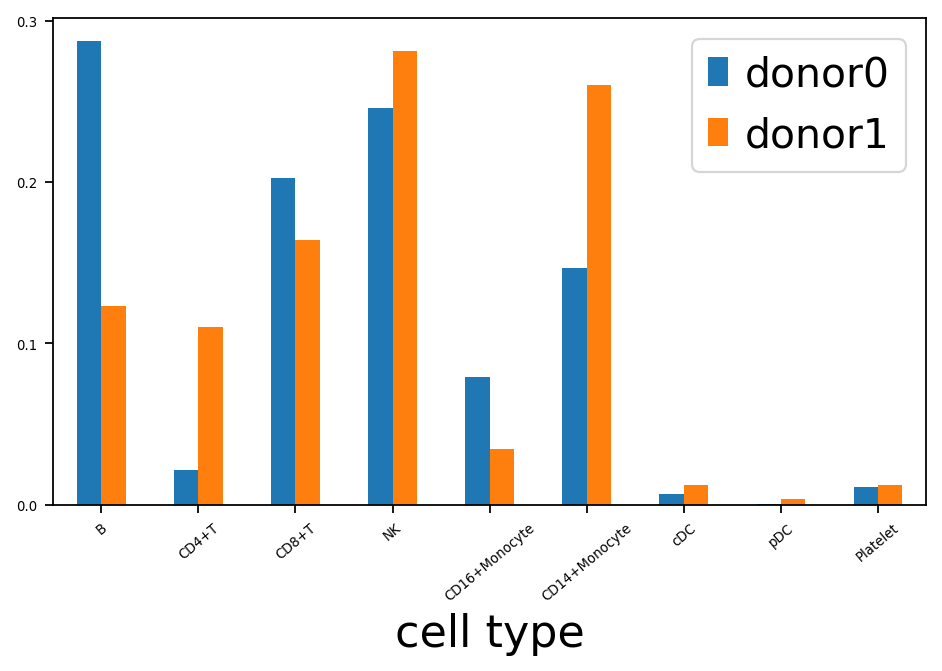

In [64]:
#df_normalized = pd.DataFrame([['donor 0', 963, 71, 678, 824,266,492,21,1,37], ['donor 1', 727, 649, 969, 1663,205,1536,70,20,71]],
                 # columns=['donor', 'B', 'CD4+T', 'CD8+T','NK', 'CD16+Monocyte','CD14+Monocyte','cDC','pDC','Platelet'])

df_normalized = pd.DataFrame([["B",963/3353,727/5910],["CD4+T",71/3353,649/5910],["CD8+T",678/3353,969/5910],["NK",824/3353,1663/5910],
                              ["CD16+Monocyte",266/3353,205/5910],["CD14+Monocyte",492/3353,1536/5910],["cDC",21/3353,70/5910],
                              ["pDC",1/3353,20/5910],["Platelet",37/3353,71/5910]],
                            columns=["cell type",'donor0',"donor1"])

df_normalized

# plot grouped bar chart
df_normalized.plot(x='cell type',
        kind='bar',
        stacked=False,
        figsize=(7,4),fontsize=6,legend=True,grid=False,rot=(40))
#plt.savefig('Cell type composition.pdf')

**saving the data**

In [65]:
#adata_final_filtered.write(results_file)

In [66]:
#results_file = '/home/mmokhtari/INF_analysis/INF_analysis_FINAL_NEW_APPROACH.h5ad'

ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


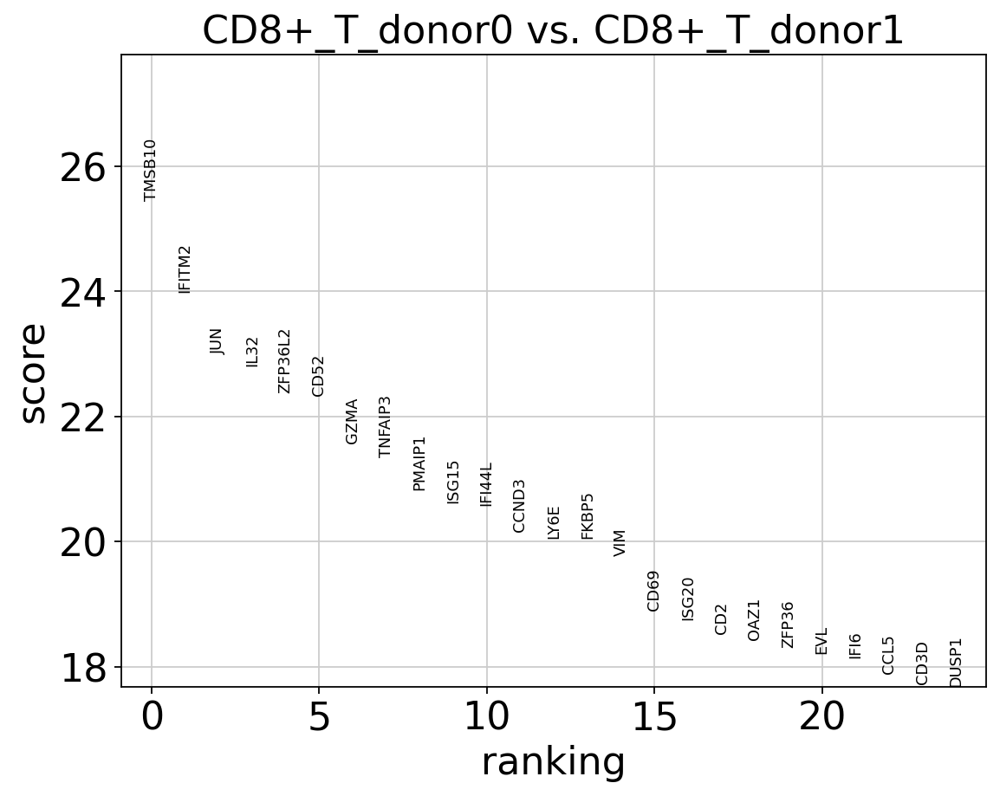

         names     scores       Cluster  logfoldchanges          pvals  \
0       TMSB10  25.451241  CD8+_T_donor        1.548045  6.839788e-143   
1       IFITM2  23.984777  CD8+_T_donor        3.639874  4.009107e-127   
2          JUN  22.993170  CD8+_T_donor        3.289395  5.455619e-117   
3         IL32  22.800039  CD8+_T_donor        2.555990  4.581073e-115   
4      ZFP36L2  22.382982  CD8+_T_donor        1.822172  5.765662e-111   
...        ...        ...           ...             ...            ...   
16875     GNLY -18.240948  CD8+_T_donor       -3.935960   2.441911e-74   
16876    CIRBP -18.610577  CD8+_T_donor       -1.440740   2.637666e-77   
16877   MT-CO3 -19.241978  CD8+_T_donor       -1.228335   1.647999e-82   
16878    RPL29 -19.695354  CD8+_T_donor       -1.089489   2.363361e-86   
16879    HLA-C -21.254513  CD8+_T_donor       -1.281324  2.994498e-100   

           pvals_adj  pct_nz_group  
0      1.154556e-138      0.977876  
1      3.383686e-123      0.793510  


In [67]:
groups=np.unique(adata_final_filtered_CD8s.obs.cell_type_donor)
groups=[x[:-1] for x in groups]
groups=np.unique(groups)

#fig, axes = plt.subplots(ncols=3, nrows=3, sharex=True, sharey=True)
#fig = plt.figure() # create the canvas for plotting
#ax1 = plt.subplot(2,1,1) 
# (2,1,1) indicates total number of rows, columns, and figure number respectively
#a=0
DE_genes=[]
for i in groups:
    sc.tl.rank_genes_groups(adata_final_filtered_CD8s,'cell_type_donor', method='wilcoxon', key_added = "wilcoxon",pts=True,reference=(i+'1'))
    sc.pl.rank_genes_groups(adata_final_filtered_CD8s, n_genes=25, sharey=False, key="wilcoxon",groups=[i+"0"])
    t=sc.get.rank_genes_groups_df(adata_final_filtered_CD8s,group=[i+"0"],key="wilcoxon")#plt.tight_layout()
    names = [i]*16880
    t.insert(2, "Cluster", names, True)
    #t.insert(4,"abs_logfoldchanges",abs(t.logfoldchanges),True)
    #print(t)
    #t=t[t["pvals_adj"]<0.05]
    #print(t)
    #t=t.sort_values("abs_logfoldchanges")
    #t=t[0:20]
    print(t)
    DE_genes.append(t)
    #t=t[t["pvals_adj"]<0.05]
    #t_up=t[t["logfoldchanges"]>1.5] 
    #t_down=t[t["logfoldchanges"]<(-1.5)]
    #t_DEG = t_up.append(t_down)
    t.to_csv(("/home/mmokhtari/INF_analysis/DEGs/PAPER_CD8"+i+".csv"))
plt.show()

In [68]:
adata_final_filtered

AnnData object with n_obs × n_vars = 9265 × 2464
    obs: 'Final_Annotation', 'donor', 'cell_type_donor', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain_r1.2', 'leiden_2'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'donor_colors', 'leiden', 'louvain', 'leiden_colors', 'rank_genes_groups', 'Final_Annotation_colors', 'leiden_2_colors', 'dendrogram_Final_Annotation', 'cell_type_donor_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

**saving signature genes as csv files**

In [69]:
t[t['names'].isin(exhaustion_signature)].to_csv(("/home/mmokhtari/INF_analysis/DEGs/exhaustion_signature.csv"))

In [70]:
t[t['names'].isin(type_1_ISG_signature)].to_csv(("/home/mmokhtari/INF_analysis/DEGs/type_1_ISG_signature.csv"))

In [71]:
t[t['names'].isin(cytotoxic_signature)].to_csv(("/home/mmokhtari/INF_analysis/DEGs/cytotoxic_signature.csv"))

**dot plots of TLRs and UNC gene in cell types**

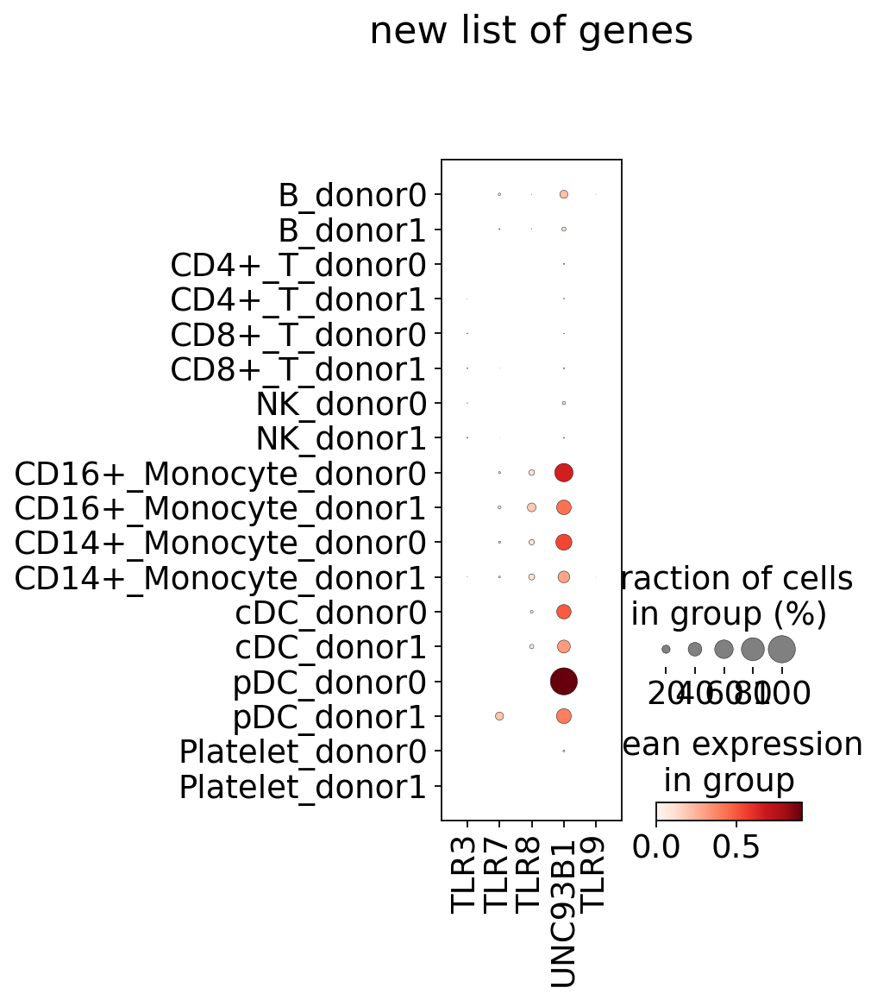

In [72]:
new_list_genes=["TLR3", "TLR7", "TLR8", "UNC93B1","TLR9"]
sc.pl.dotplot(adata_final_filtered,new_list_genes, groupby='cell_type_donor',dendrogram=False, use_raw=True,title="new list of genes",
             categories_order=[
                                                                                   "B_donor0","B_donor1",
                                                                                   "CD4+_T_donor0","CD4+_T_donor1",
                                                                                   "CD8+_T_donor0","CD8+_T_donor1",
                                                                                   "NK_donor0","NK_donor1",
                                                                                   "CD16+_Monocyte_donor0","CD16+_Monocyte_donor1",
                                                                                   "CD14+_Monocyte_donor0","CD14+_Monocyte_donor1",
                                                                                   "cDC_donor0","cDC_donor1",
                                                                                   "pDC_donor0","pDC_donor1",
                              "Platelet_donor0","Platelet_donor1"],save=True)

In [73]:
adata_final_filtered_CD8s.obs

,Final_Annotation,donor,cell_type_donor,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,louvain_r1.2,leiden_2,score_exhaustion_signature,score_cytotoxic_signature,score_type_1_ISG_signature
AAACCCAAGGGATCGT-1,CD8+_T,donor0,CD8+_T_donor0,887,887,1383.0,10.0,0.723066,2,13,7,-0.109609,-0.860871,0.112389
AAACCCAGTGGCTGAA-1,CD8+_T,donor1,CD8+_T_donor1,1306,1306,4333.0,50.0,1.153935,2,13,7,-0.115120,-0.811996,0.081123
AAACCCATCATGAAAG-1,CD8+_T,donor0,CD8+_T_donor0,1411,1410,2479.0,82.0,3.307786,4,5,8,-0.166925,0.266875,0.209852
AAACGAAAGAGAAGGT-1,CD8+_T,donor1,CD8+_T_donor1,1487,1487,3427.0,120.0,3.501605,11,12,2,0.008147,-0.788060,-0.110420
AAACGAAGTCATCCGG-1,CD8+_T,donor0,CD8+_T_donor0,2016,2016,4978.0,112.0,2.249899,4,5,8,0.072695,-1.011388,0.209105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGAGGAGGGTG-1,CD8+_T,donor0,CD8+_T_donor0,1501,1501,3298.0,60.0,1.819284,4,5,8,0.000528,-0.167221,0.156901
TTTGGAGAGTGCAACG-1,CD8+_T,donor0,CD8+_T_donor0,1868,1868,3883.0,44.0,1.133144,4,5,8,-0.185028,1.087778,0.315498
TTTGGAGAGTGTAGTA-1,CD8+_T,donor1,CD8+_T_donor1,1390,1390,3662.0,117.0,3.194975,11,12,2,-0.143518,-0.839124,-0.093332
TTTGGTTGTTGTTGTG-1,CD8+_T,donor0,CD8+_T_donor0,1532,1532,4227.0,9.0,0.212917,4,5,8,-0.007218,0.743313,0.359220


**running Wilcoxon rank-sum test on signatures**

In [74]:
ranksums(adata_final_filtered_CD8s.obs.score_exhaustion_signature[adata_final_filtered_CD8s.obs["donor"]=="donor0"],
        adata_final_filtered_CD8s.obs.score_exhaustion_signature[adata_final_filtered_CD8s.obs["donor"]=="donor1"],
        alternative='two-sided')

RanksumsResult(statistic=14.46554030306411, pvalue=2.0002805814330573e-47)

In [75]:
ranksums(adata_final_filtered_CD8s.obs.score_cytotoxic_signature[adata_final_filtered_CD8s.obs["donor"]=="donor0"],
        adata_final_filtered_CD8s.obs.score_cytotoxic_signature[adata_final_filtered_CD8s.obs["donor"]=="donor1"])

RanksumsResult(statistic=6.303065147191867, pvalue=2.918161582978736e-10)

In [76]:
ranksums(adata_final_filtered_CD8s.obs.score_type_1_ISG_signature[adata_final_filtered_CD8s.obs["donor"]=="donor0"],
        adata_final_filtered_CD8s.obs.score_type_1_ISG_signature[adata_final_filtered_CD8s.obs["donor"]=="donor1"])

RanksumsResult(statistic=32.05750451212874, pvalue=1.7255654364778993e-225)

**running BBKNN on the data**

In [77]:
adata_BBKNN = sc.read_h5ad('/home/mmokhtari/INF_analysis/INF_analysis_FINAL_NEW_APPROACH.h5ad')

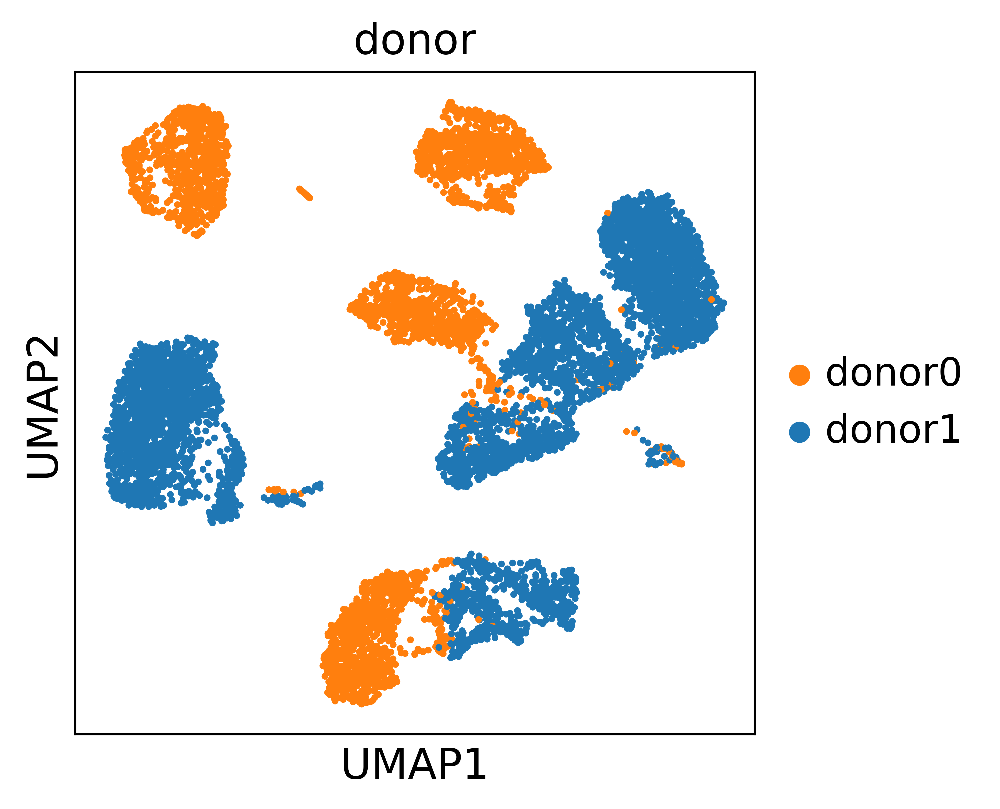

In [79]:
#Visualize the clusters with umap 
#rcParams['figure.figsize']=(10,10)
#fig_ind=np.arange(131, 133)
#fig = plt.figure()
#fig.subplots_adjust(hspace=0.4, wspace=0.6)
#sc.set_figure_params(vector_friendly=True,dpi=648.0)
#plt.rcParams['figure.dpi'] = 500.0
sc.pl.umap(adata_BBKNN, color=["donor"],palette={
        "donor0": "#FF7F0E",
        "donor1": "#1F77B4",
    },edgecolor='none',size=20, show=True, linewidths=10,wspace=0.3,sort_order=False)

#Visualize the clusters with umap 
#rcParams['figure.figsize']=(10,10)
#fig_ind=np.arange(131, 133)
#fig = plt.figure()
#fig.subplots_adjust(hspace=0.4, wspace=0.6)
sc.set_figure_params(vector_friendly=True,dpi=648.0)
plt.rcParams['figure.dpi'] = 500.0
sc.pl.umap(adata_BBKNN, color=['leiden_2',"donor","Final_Annotation"],edgecolor='none',size=20, show=True, linewidths=10,save=True,wspace=0.3)
